<a href="https://colab.research.google.com/github/ambreen2006/liveproject_surface_water_changes_satellite_data/blob/master/Milestone-5/Milestone-5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Milestone-5
**Project:** Monitoring Changes in Surface Water Using Satellite Image Data.

**Deliverable** Various optimization techniques applied to training the neural networking for the purpose of identifiying the water regions.

## Overview

* **Optimization**

    Following optimization techniques were applied to the network:
        * Adaptive learning rate optimization based on monitoring the validation loss
        * Adding more layers to the network
        * Batch normalization
        * Addition of residual connections
        * Ensembling different models to make the prediction

*   **Data Preprocessing**

     The data created in the previous milestones are further organized using the script in Scripts/data_organizer_script.py

  The hierarchy is as follows:

```
    NWPU
        \
         Test
         |    \
         |     Images
         |     |     \
         |     |      data -> *.img of actual lakes
         |     Masks
         |          \
         |           data -> mask_*.img mask images
         |
         Train
         |    \
         |     Images
         |     |     \
         |     |      data -> *.img of actual lakes
         |     Masks
         |          \
         |           data -> mask_*.img mask images
         |
    S2_Cloudless
        \
         Test
         |    \
         |     Images
         |     |     \
         |     |      data -> *.img of actual lakes
         |     Masks
         |          \
         |           data -> mask_*.img mask images
         |
         Train
         |    \
         |     Images
         |     |     \
         |     |      data -> *.img of actual lakes
         |     Masks
         |          \
         |           data -> mask_*.img mask images
         | 
 ```


*   **Data Augmentation**

    Data is augmented using `ImageDataGenerator`


* **UNet Model**

  Model takes 256*256 size images and output greyscale segmentation mask.

* **Metrics**

  `binary_crossentropy` is used for loss and `IoU` is computed as additional metric.

* **Optimzation**

  `Adam` is used with default settings.





  







## Google Drive Connect

In [19]:
colab = 1

from google.colab import drive

if colab == 1:
  drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Imports

In [20]:
import os
import json
import pathlib
import shutil
import tarfile
import numpy as np

import tensorflow as tf
from tensorflow.keras import backend
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Concatenate, Conv2DTranspose, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation, Add
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

from sklearn.model_selection import train_test_split

import matplotlib
from matplotlib import pyplot as plt

import pickle

In [21]:
if colab:
  os.chdir('/content/drive/My Drive/Module_5_Colab_Live_Project_Surface_Water/')

In [22]:
os.getcwd()

'/content/drive/My Drive/Module_5_Colab_Live_Project_Surface_Water'

In [23]:
from Python_SQLite_Helper.SQLiteHelper import SQLiteHelper

## Setup

Google drive is setup that contains the data in the expected fodler.

In [7]:
%load_ext tensorboard

In [24]:
working_dir = os.getcwd() + '/'
image_dir = working_dir + 'Milestone-5/Data_Module/'

In [25]:
input_images_dir = image_dir + 'NWPU/Train/Images/'
input_masks_dir = image_dir + 'NWPU/Train/Masks/'
test_images_dir = image_dir + 'NWPU/Test/Images/'
test_masks_dir = image_dir + 'NWPU/Test/Masks/'

In [26]:
TARGET_WIDTH = TARGET_HEIGHT = 256
BATCH_SIZE = 10

In [27]:
def clip_mask(msk):
  msk[msk < 100] = 0
  msk[msk >= 150] = 255
  return msk

Setup data generators

In [28]:
train_data_args = dict(shear_range=0,
                       zoom_range=0,
                       rotation_range=90,
                       rescale=1./255,
                       horizontal_flip=True)

train_mask_args =  dict(shear_range=0,
                        zoom_range=0,
                        rotation_range=90,
                        rescale=1./255,
                        preprocessing_function=clip_mask,
                        horizontal_flip=True)

test_data_args = dict(rescale=1./255)
test_mask_args = dict(rescale=1./255, preprocessing_function=clip_mask)

train_datagen = ImageDataGenerator(**train_data_args)
train_maskgen = ImageDataGenerator(**train_mask_args)

test_datagen = ImageDataGenerator(**test_data_args)
test_maskgen = ImageDataGenerator(**test_mask_args)

In [29]:
def create_generators_for_input(train_images_dir, train_masks_dir,
                                test_images_dir, test_masks_dir):
  
  img_generator = train_datagen.flow_from_directory(train_images_dir,
                                                    target_size=(TARGET_WIDTH, TARGET_HEIGHT),
                                                    batch_size=BATCH_SIZE,
                                                    class_mode=None, 
                                                    seed=111, 
                                                    shuffle=False)

  mask_generator = train_maskgen.flow_from_directory(train_masks_dir,
                                                     target_size=(TARGET_WIDTH, TARGET_HEIGHT),
                                                     color_mode = 'grayscale',
                                                     batch_size=BATCH_SIZE,
                                                     class_mode=None, 
                                                     seed=111, 
                                                    shuffle=False)

  test_img_generator = test_datagen.flow_from_directory(test_images_dir,
                                                        target_size=(TARGET_WIDTH, TARGET_HEIGHT),
                                                        batch_size=BATCH_SIZE,
                                                        class_mode=None, 
                                                        seed=111,
                                                        shuffle=False)

  test_mask_generator = test_maskgen.flow_from_directory(test_masks_dir,
                                                         target_size=(TARGET_WIDTH, TARGET_HEIGHT),
                                                         color_mode = 'grayscale',
                                                         batch_size=BATCH_SIZE,
                                                         class_mode=None, 
                                                         seed=111,
                                                         shuffle=False)

  train_generator = (pair for pair in zip(img_generator, mask_generator))
  test_generator = (pair for pair in zip(test_img_generator, test_mask_generator))
  return train_generator, test_generator

In [30]:
train_generator, test_generator = create_generators_for_input(input_images_dir, 
                                                              input_masks_dir, 
                                                              test_images_dir, 
                                                              test_masks_dir)

Found 489 images belonging to 1 classes.
Found 489 images belonging to 1 classes.
Found 163 images belonging to 1 classes.
Found 163 images belonging to 1 classes.


In [31]:
s2_input_images_dir = image_dir + 'S2_Cloudless/Train/Images/'
s2_input_masks_dir = image_dir + 'S2_Cloudless/Train/Masks/'
s2_test_images_dir = image_dir + 'S2_Cloudless/Test/Images/'
s2_test_masks_dir = image_dir + 'S2_Cloudless/Test/Masks/'

In [32]:
s2_train_generator, s2_test_generator = create_generators_for_input(
                                          s2_input_images_dir, 
                                          s2_input_masks_dir, 
                                          s2_test_images_dir, 
                                          s2_test_masks_dir
                                          )

Found 30 images belonging to 1 classes.
Found 30 images belonging to 1 classes.
Found 10 images belonging to 1 classes.
Found 10 images belonging to 1 classes.


Utility method to show masks along side the images

In [33]:
def pair_image_with_mask(img, mask):
    mask = mask.squeeze()
    mask = np.stack((mask,)*3, axis=-1)
    return np.concatenate([img, mask], axis = 1)

In [34]:
def show_combined_plots(x, y, batch_sz, fsize):
  cols = 2
  rows = batch_sz//cols
  _, axs = plt.subplots(rows, cols, figsize = fsize)
  axs = axs.flatten()
  for i in range (0, batch_sz):
    combined = pair_image_with_mask(x[i], y[i])
    axs[i].axis('off')
    axs[i].imshow(combined)

  plt.tight_layout()

In [17]:
img, msk = next(s2_test_generator)

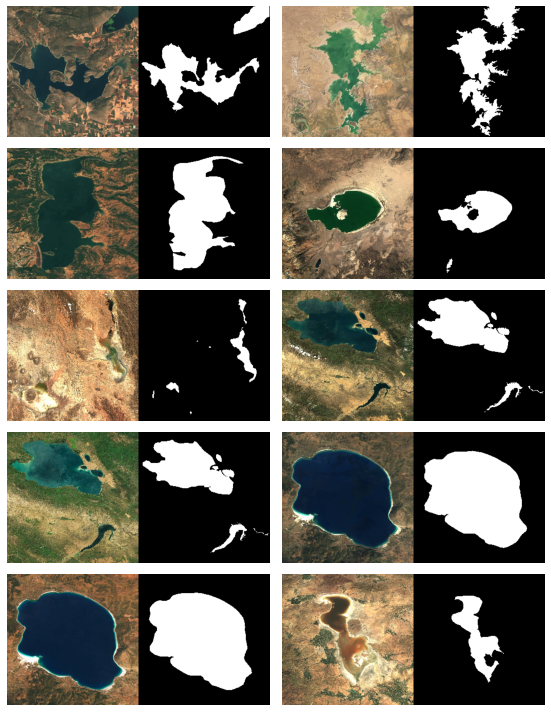

In [18]:
show_combined_plots(img, msk, BATCH_SIZE, (8, 10))

Utility method to call predict and show the outcome 

In [43]:
def show_prediction(m, gen):
  X_test, y_test = next(gen)
  y_pred = m._model.predict(X_test)
  show_combined_plots(X_test, y_pred, BATCH_SIZE, (8, 10))

## UNet model

IoU calculation

In [155]:
def iou_coef(y_true, y_pred):
  i = tf.reduce_sum(y_true*y_pred, axis = -1)
  u = tf.reduce_sum(y_true + y_pred, axis = -1) - i
  #iou = tf.reduce_mean(tf.where(tf.equal(u, 0), 1.0, i/u))
  iou = tf.reduce_mean((i+1)/(u+1))
  return iou

In [37]:
def iou_loss(y_true, y_pred):
  return 1-iou_coef(y_true, y_pred)

In [38]:
def dice_coef(y_true, y_pred):
  y_true = tf.reshape(y_true, [-1])
  y_pred = tf.reshape(y_true, [-1])
  i = 2*tf.reduce_sum(y_true*y_pred, axis = -1)
  u = tf.reduce_sum(y_true + y_pred, axis = -1)
  dice = (i+1)/(u+1)
  return dice

In [39]:
def dice_loss(y_true, y_pred):
  return 1-dice_coef(y_true, y_pred)

UNet implementation

In [40]:
class unet_base():

    def __init__():
      self._model = None
      pass

    def train(self, train_gen, test_gen, batch, e, steps, vsteps, callbacks):

      self.history = self._model.fit(train_gen,
                                     verbose = 1,
                                     callbacks = callbacks,
                                     validation_data = test_gen,
                                     batch_size = batch,
                                     epochs = e,
                                     steps_per_epoch = steps,
                                     validation_steps = vsteps,
                                     use_multiprocessing=False
                                     )
    
    def predict(self, X):
      return self._model.predict(X)

In [46]:
class unet(unet_base):
    def __init__(self):
        inputs = Input((TARGET_HEIGHT, TARGET_HEIGHT, 3))
        _tensor = inputs

        f = 32
        layers = []

        for i in range(0, 4):
            _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
            layers.append(_tensor)
            _tensor = MaxPooling2D()(_tensor)
            f = f*2

        ff2 = 1024
        j = len(layers)-1
        _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
        
        _tensor = Concatenate(axis = 3)([_tensor, layers[j]])
        j = j-1
  
        for i in range(0, 3):
            ff2 = ff2//2
            f = f//2
            _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
            _tensor = Concatenate(axis = 3)([_tensor, layers[j]])          
            j = j - 1

        _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(f, 3, activation = 'relu', padding = 'same')(_tensor)
 
        outputs = Conv2D(1, 1, activation = 'sigmoid')(_tensor)
  
        custom_metrics = [iou_coef, iou_loss, dice_coef, dice_loss]
        self._model = Model(inputs, outputs)
        self._model.compile(optimizer='adam', 
                            loss='binary_crossentropy',
                            metrics = custom_metrics)

    def train(self, train_gen, test_gen, batch, e, steps, vsteps, callbacks):
      self.history = self._model.fit(train_gen,
                                     verbose = 1,
                                     callbacks = callbacks,
                                     validation_data = test_gen,
                                     batch_size = batch,
                                     epochs = e,
                                     steps_per_epoch = steps,
                                     validation_steps = vsteps,
                                     use_multiprocessing=True
                                     )

In [47]:
unet_model = unet()

Model summary

In [ ]:
unet_model._model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 32) 9248        conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 128, 128, 32) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [ ]:
model_path = working_dir + 'base_unet_model.png'

In [ ]:
_ = plot_model(model=unet_model._model, to_file=model_path,show_shapes=True, show_layer_names=True)

## Setup callback for recording metrics in SQLite

In [48]:
class MetricsRecorder(tf.keras.callbacks.Callback):

  def __init__(self, model_name, type, db_path):

    self.type = type
    self.model_name = model_name
    self.table_name = 'Metrics'

    fields_info = {
        'model': 'TEXT',
        'type': 'TEXT',
        'epoch': 'INTEGER',
        'iou': 'REAL', 
        'dice':'REAL',
        'binary_crossentropy_loss': 'REAL',
        'iou_loss': 'REAL',
        'dice_loss': 'REAL'
    }
    self.sqlite_manager = SQLiteHelper(db_path)
    result, _ = self.sqlite_manager.create(self.table_name, fields_info)
    if result:
      display('Table created')

  def on_epoch_end(self, epoch, logs = {}):

    iou = logs.get('val_iou_coef')
    dice = logs.get('val_dice_coef')
    binary_crossentropy_loss = logs.get('val_loss')
    dice_loss = logs.get('val_dice_loss')
    iou_loss = logs.get('val_iou_loss')

    key_list = ['iou', 'dice', 'binary_crossentropy_loss', 'dice_loss', 'iou_loss']
    value_list = [iou, dice, binary_crossentropy_loss, dice_loss, iou_loss]
    
    record = {'model': self.model_name, 'type': self.type, 'epoch': epoch}
    record_metrics = {k:v for (k, v) in zip(key_list, value_list) if v}
    record.update(record_metrics)
    
    self.sqlite_manager.insert(self.table_name, record)

  def fetch(self, selections, conditions):
    result, cursor = self.sqlite_manager.fetch(self.table_name, 
                                               selections,
                                               conditions)
    return cursor


## Training with NWPU data

In [42]:
def create_callbacks(experiment_label = 'model', 
                     early_stop_loss_monitor = 'val_loss',
                     logs_dir = 'logs/fit/', include_tensor_board = True,
                     patience = 5, db_path = None):
  """
  Creates and setup various callbacks

  Returns:
  --------
  cb: list of callbacks containing early stopping, checkpoint, tensorboard, and
  database_record.
  """

  pickle_path = experiment_label + '.h5'

  checkpoint = ModelCheckpoint(pickle_path, 
                               monitor = early_stop_loss_monitor, 
                               mode = 'min', 
                               verbose = 1, 
                               save_best_only = True)

  early_stop_condition = EarlyStopping(monitor = 'val_loss', 
                                      mode = 'min',
                                      verbose = 1, 
                                      patience = patience)

  cb = [early_stop_condition, checkpoint]
  
  if db_path:
    db_recorder = MetricsRecorder(experiment_label, 'validation', db_path)
    cb.append(db_recorder)

  if include_tensor_board:
    logs_dir = logs_dir + experiment_label + '/'
    tboard = TensorBoard(log_dir = logs_dir)
    cb.append(tboard)

  return cb, pickle_path, logs_dir, db_recorder

In [ ]:
db_path = 'model_metrics.db'
cb, pickle_path, logs_dir, db_recorder = create_callbacks(
    experiment_label = 'base_model', db_path = db_path)

Connected to SQLite DB


'Table created'

In [ ]:
%%time
unet_model.train(train_generator, test_generator, 
                 BATCH_SIZE, 
                 100, 12, 12,
                 cb)

Epoch 1/100
12/12 [==============================] - ETA: 0s - loss: 0.6594 - iou_coef: 0.7285 - iou_loss: 0.2715 - dice_coef: 0.7383 - dice_loss: 0.2617 WARNING:tensorflow:Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `tf.data.Dataset`.

Epoch 00001: val_loss improved from inf to 0.54893, saving model to /content/drive/My Drive/Module_5_Colab_Live_Project_Surface_Water/base_model.h5
12/12 [==============================] - 513s 43s/step - loss: 0.6594 - iou_coef: 0.7285 - iou_loss: 0.2715 - dice_coef: 0.7383 - dice_loss: 0.2617 - val_loss: 0.5489 - val_iou_coef: 0.7266 - val_iou_loss: 0.2734 - val_dice_coef: 0.7368 - val_dice_loss: 0.2632
Epoch 2/100
12/12 [==============================] - ETA: 0s - loss: 0.4735 - iou_coef: 0.7920 - iou_loss: 0.2080 - dice_coef: 0.8021 - dice_loss: 0.1979 WARNING:tensorflow:Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please 

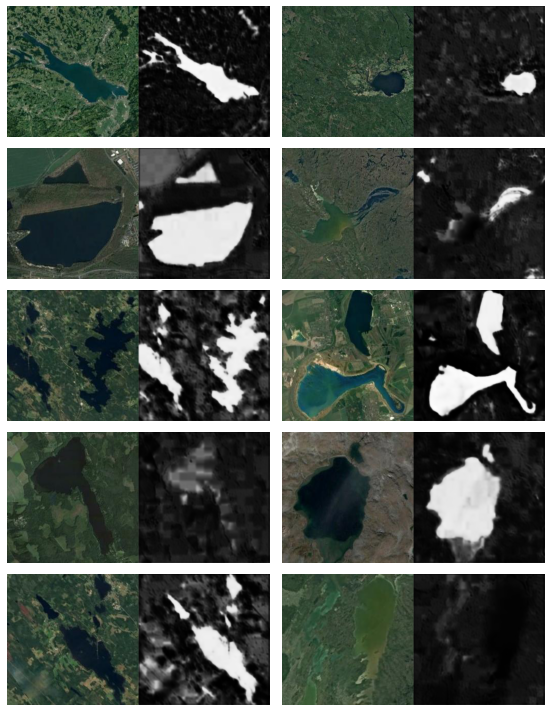

In [ ]:
show_prediction(unet_model, test_generator)

In [ ]:
unet_model.history.history.keys()

dict_keys(['loss', 'iou_coef', 'iou_loss', 'dice_coef', 'dice_loss', 'val_loss', 'val_iou_coef', 'val_iou_loss', 'val_dice_coef', 'val_dice_loss'])

History plot for loss and IoU



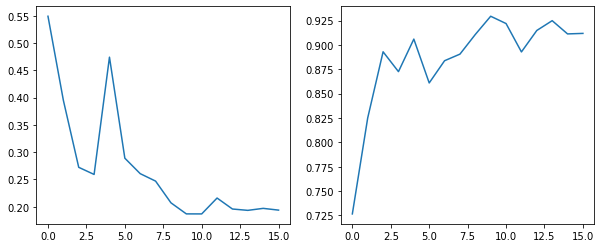

In [ ]:
_, axs = plt.subplots(1,2, figsize = (10, 4))
axs[0].plot(unet_model.history.history['val_loss'])
axs[1].plot(unet_model.history.history['val_iou_coef'])

In [ ]:
selections = 'MAX(epoch)'
conditions = 'model = "base_model"'
cursor = db_recorder.fetch(selections, conditions)
for row in cursor:
  display(row)

(15,)

In [ ]:
history_path_nwpu = working_dir + 'nwpu_history.json'
with open(history_path_nwpu, 'w') as nwpuhist:
  json.dump(unet_model.history.history, nwpuhist)

In [ ]:
del unet_model

In [49]:
def restore_unet_model(path):
  restored_unet = unet()
  restored_unet._model.load_weights(pickle_path)
  return restored_unet


In [ ]:
pickle_path = working_dir + 'base_model.h5'

In [ ]:
restored_unet = restore_unet_model(pickle_path)

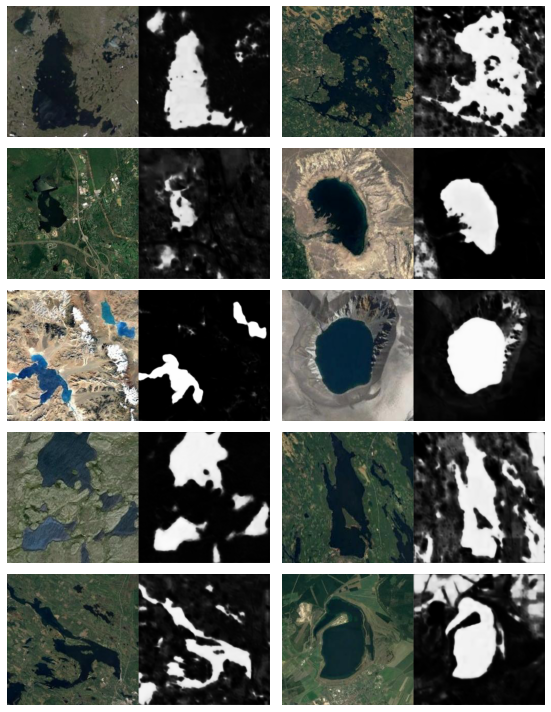

In [ ]:
show_prediction(restored_unet, test_generator)

In [ ]:
%tensorboard --logdir '{logs_dir}'

<IPython.core.display.Javascript object>

### Testing NWPU trained network on S2 data

In [ ]:
show_prediction(restored_unet, s2_test_generator)

## Training with adaptive learning rate

In [50]:
def build_callback_with_adaptive_lru(patience_early_stop,
                                     patience_lr, factor, min_delta, min_lr, 
                                     cooldown,
                                     early_stop_loss_monitor = 'val_loss', 
                                     experiment_label = 'alr_model'):

  cb, pickle_path, logs_dir, db_recorder = create_callbacks(
      experiment_label, patience = patience_early_stop, 
      early_stop_loss_monitor=early_stop_loss_monitor,
      db_path = 'model_metrics.db')
  
  reduce_loss = ReduceLROnPlateau(monitor=early_stop_loss_monitor, factor = factor, 
                                 patience=patience_lr, 
                                 verbose=1, mode='auto', min_delta=min_delta, 
                                 cooldown=cooldown, min_lr=min_lr)
  cb.append(reduce_loss)
  return cb, pickle_path, logs_dir, db_recorder

In [ ]:
cb, pickle_path, logs_dir, db_recorder = build_callback_with_adaptive_lru(
    patience = 10, factor = 0.2, min_delta = 0.0001, min_lr = 0.0001,
    cooldown = 5 
)

Connected to SQLite DB


'Table created'

In [ ]:
%%time
unet_model.train(train_generator, test_generator, 
                 BATCH_SIZE, 
                 100, 12, 12,
                 cb)

Epoch 1/100
12/12 [==============================] - ETA: 0s - loss: 0.5694 - iou_coef: 0.7593 - iou_loss: 0.2407 - dice_coef: 0.7686 - dice_loss: 0.2314 WARNING:tensorflow:Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `tf.data.Dataset`.

Epoch 00001: val_loss improved from inf to 0.46632, saving model to alr_model_2.h5
12/12 [==============================] - 524s 44s/step - loss: 0.5694 - iou_coef: 0.7593 - iou_loss: 0.2407 - dice_coef: 0.7686 - dice_loss: 0.2314 - val_loss: 0.4663 - val_iou_coef: 0.7671 - val_iou_loss: 0.2329 - val_dice_coef: 0.7770 - val_dice_loss: 0.2230 - lr: 0.0010
Epoch 2/100
12/12 [==============================] - ETA: 0s - loss: 0.4682 - iou_coef: 0.8074 - iou_loss: 0.1926 - dice_coef: 0.8172 - dice_loss: 0.1828 WARNING:tensorflow:Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `tf.data.Dataset`.

Epoch 00002: 

In [ ]:
pickle_path = working_dir + 'alr_model_2.h5'

In [ ]:
restored_alr_unet = restore_unet_model(pickle_path)

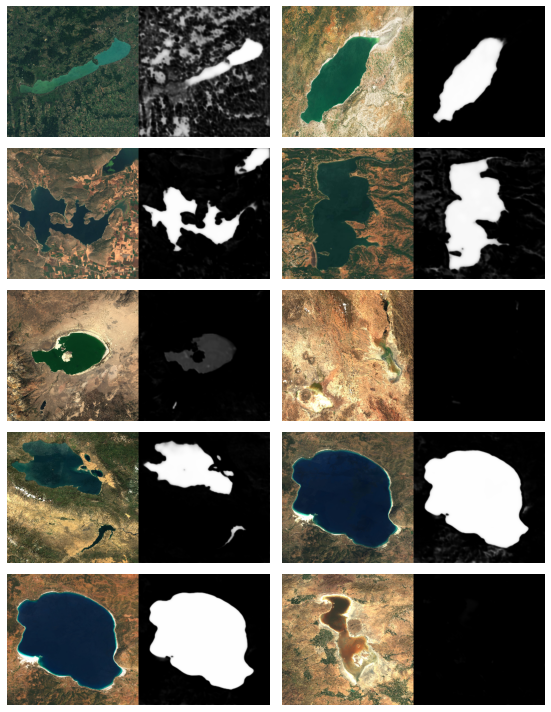

In [ ]:
show_prediction(restored_alr_unet, s2_test_generator)

## Increasing the number of layers

In [51]:
class unet_exp1(unet_base):

    def __init__(self, input_size, filter, ff2):
        inputs = Input(input_size)
        _tensor = inputs

        layers = []

        for i in range(0, 6):
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            layers.append(_tensor)
            _tensor = MaxPooling2D()(_tensor)
            filter = filter*2

        j = len(layers)-1
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
        
        _tensor = Concatenate(axis = 3)([_tensor, layers[j]])
        j = j-1
  
        for i in range(0, 5):
            ff2 = ff2//2
            filter = filter//2
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
            _tensor = Concatenate(axis = 3)([_tensor, layers[j]])          
            j = j - 1

        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
 
        outputs = Conv2D(1, 1, activation = 'sigmoid')(_tensor)
  
        custom_metrics = [iou_coef, iou_loss, dice_coef, dice_loss]
        self._model = Model(inputs, outputs)
        self._model.compile(optimizer='adam', 
                            loss='binary_crossentropy',
                            metrics = custom_metrics)

    def train(self, train_gen, test_gen, batch, e, steps, vsteps, callbacks):
      self.history = self._model.fit(train_gen,
                                     verbose = 1,
                                     callbacks = callbacks,
                                     validation_data = test_gen,
                                     batch_size = batch,
                                     epochs = e,
                                     steps_per_epoch = steps,
                                     validation_steps = vsteps,
                                     use_multiprocessing=False
                                     )

In [52]:
unet_exp1_ins =  unet_exp1((TARGET_HEIGHT, TARGET_HEIGHT, 3), 16, 128)

In [ ]:
unet_exp1_ins._model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 128, 128, 16) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [94]:
cb, pickle_path, logs_dir, db_recorder = build_callback_with_adaptive_lru(
    patience_early_stop = 20, patience_lr = 10, factor = 0.2, min_delta = 0.0001, min_lr = 0.0001,
    cooldown = 5,
    experiment_label='unet_exp2_ins' 
)

Connected to SQLite DB


'Table created'

In [ ]:
%%time
unet_exp1_ins.train(train_generator, test_generator, 
                 BATCH_SIZE, 
                 200, 12, 12,
                 cb)

In [53]:
def restore_more_layers_model():
  pickle_path = working_dir + 'unet_exp2_ins.h5'
  restored_unet =  unet_exp1((TARGET_HEIGHT, TARGET_HEIGHT, 3), 16, 128)
  restored_unet._model.load_weights(pickle_path)
  return restored_unet

In [54]:
restored_unet = restore_more_layers_model()
display(restored_unet)

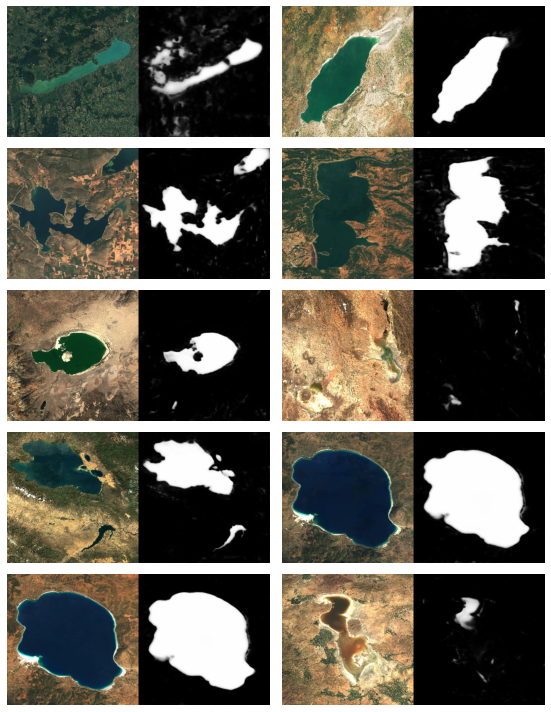

In [ ]:
show_prediction(restored_unet, s2_test_generator)

## Model with Dropout layer

In [55]:
class unet_dropout(unet_base):
  
  def restore(self, pickle_path):
    self._model.load_weights(pickle_path)

  def __init__(self, input_size = (TARGET_HEIGHT, TARGET_WIDTH, 3), filter = 16, 
               ff2 = 128, drop_rate = 0.25):

        super()
        inputs = Input(input_size)
        _tensor = inputs

        layers = []

        for i in range(0, 6):
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            layers.append(_tensor)
            _tensor = MaxPooling2D()(_tensor)
            _tensor = Dropout(drop_rate)(_tensor)
            filter = filter*2

        j = len(layers)-1
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
        
        _tensor = Concatenate(axis = 3)([_tensor, layers[j]])
        j = j-1
  
        for i in range(0, 5):
            ff2 = ff2//2
            filter = filter//2
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
            _tensor = Concatenate(axis = 3)([_tensor, layers[j]])
            _tensor = Dropout(drop_rate)(_tensor)          
            j = j - 1

        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
 
        outputs = Conv2D(1, 1, activation = 'sigmoid')(_tensor)
  
        custom_metrics = [iou_coef, iou_loss, dice_coef, dice_loss]
        self._model = Model(inputs, outputs)
        self._model.compile(optimizer='adam', 
                            loss='binary_crossentropy',
                            metrics = custom_metrics)
    

In [97]:
cb, pickle_path, logs_dir, db_recorder = build_callback_with_adaptive_lru(
    patience_early_stop = 30, patience_lr = 10, factor = 0.2, min_delta = 0.0001, min_lr = 0.0001,
    cooldown = 5,
    experiment_label='unet_dropout_exp_1' 
)

Connected to SQLite DB


'Table created'

In [66]:
unet_dropout_ins = unet_dropout()

In [99]:
%%time
unet_dropout_ins.train(train_generator, test_generator, 
                 BATCH_SIZE, 
                 200, 12, 12,
                 cb)

Epoch 1/200
12/12 [==============================] - ETA: 0s - loss: 0.5400 - iou_coef: 0.0772 - iou_loss: 0.9228 - dice_coef: 0.7691 - dice_loss: 0.2309
Epoch 00001: val_loss improved from inf to 0.43158, saving model to unet_dropout_exp_1.h5
12/12 [==============================] - 121s 10s/step - loss: 0.5400 - iou_coef: 0.0772 - iou_loss: 0.9228 - dice_coef: 0.7691 - dice_loss: 0.2309 - val_loss: 0.4316 - val_iou_coef: 0.0483 - val_iou_loss: 0.9517 - val_dice_coef: 0.8462 - val_dice_loss: 0.1538 - lr: 0.0010
Epoch 2/200
12/12 [==============================] - ETA: 0s - loss: 0.4431 - iou_coef: 0.0664 - iou_loss: 0.9336 - dice_coef: 0.8277 - dice_loss: 0.1723
Epoch 00002: val_loss improved from 0.43158 to 0.41825, saving model to unet_dropout_exp_1.h5
12/12 [==============================] - 120s 10s/step - loss: 0.4431 - iou_coef: 0.0664 - iou_loss: 0.9336 - dice_coef: 0.8277 - dice_loss: 0.1723 - val_loss: 0.4183 - val_iou_coef: 0.0788 - val_iou_loss: 0.9212 - val_dice_coef: 0.81

In [56]:
def restore_dropout_model():
  unet_restored = unet_dropout()
  unet_restored.restore('unet_dropout_exp_1.h5')
  return unet_restored

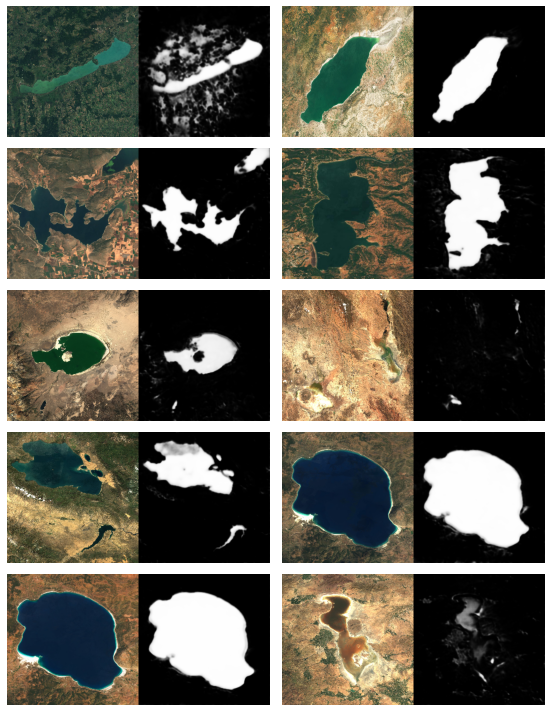

In [56]:
show_prediction(unet_restored, s2_test_generator)

## Using Batch Normalization

In [68]:
class unet_batch(unet_base):
  
  def restore(self, pickle_path):
    self._model.load_weights(pickle_path)

  def __init__(self, input_size = (TARGET_HEIGHT, TARGET_WIDTH, 3), filter = 16, 
               ff2 = 128, drop_rate = 0.25):

        super()
        inputs = Input(input_size)
        _tensor = inputs

        layers = []

        for i in range(0, 6):
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = BatchNormalization()(_tensor)
            layers.append(_tensor)
            _tensor = MaxPooling2D()(_tensor)
            _tensor = Dropout(drop_rate)(_tensor)
            filter = filter*2

        j = len(layers)-1
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
        
        _tensor = Concatenate(axis = 3)([_tensor, layers[j]])
        j = j-1
  
        for i in range(0, 5):
            ff2 = ff2//2
            filter = filter//2
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
            _tensor = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same')(_tensor)
            _tensor = Concatenate(axis = 3)([_tensor, layers[j]])
            _tensor = Dropout(drop_rate)(_tensor)          
            j = j - 1

        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
        _tensor = Conv2D(filter, 3, activation = 'relu', padding = 'same')(_tensor)
 
        outputs = Conv2D(1, 1, activation = 'sigmoid')(_tensor)
  
        custom_metrics = [iou_coef, iou_loss, dice_coef, dice_loss]
        self._model = Model(inputs, outputs)
        self._model.compile(optimizer='adam', 
                            loss='binary_crossentropy',
                            metrics = custom_metrics)

In [69]:
%%time

cb, pickle_path, logs_dir, db_recorder = build_callback_with_adaptive_lru(
    patience_early_stop = 30, patience_lr = 10, factor = 0.2, min_delta = 0.0001, min_lr = 0.0001,
    cooldown = 5,
    experiment_label='unet_batch_exp_2' 
)

unet_batch_ins = unet_batch()

unet_batch_ins.train(train_generator, test_generator, 
                 BATCH_SIZE, 
                 200, 12, 12,
                 cb)

Connected to SQLite DB


'Table created'

Epoch 1/200
12/12 [==============================] - ETA: 0s - loss: 0.4280 - iou_coef: 0.0991 - iou_loss: 0.9009 - dice_coef: 0.8246 - dice_loss: 0.1754
Epoch 00001: val_loss improved from inf to 0.61221, saving model to unet_batch_exp_2.h5
12/12 [==============================] - 115s 10s/step - loss: 0.4280 - iou_coef: 0.0991 - iou_loss: 0.9009 - dice_coef: 0.8246 - dice_loss: 0.1754 - val_loss: 0.6122 - val_iou_coef: 0.0888 - val_iou_loss: 0.9112 - val_dice_coef: 0.7176 - val_dice_loss: 0.2824 - lr: 0.0010
Epoch 2/200
12/12 [==============================] - ETA: 0s - loss: 0.2757 - iou_coef: 0.1569 - iou_loss: 0.8431 - dice_coef: 0.9111 - dice_loss: 0.0889
Epoch 00002: val_loss improved from 0.61221 to 0.59183, saving model to unet_batch_exp_2.h5
12/12 [==============================] - 116s 10s/step - loss: 0.2757 - iou_coef: 0.1569 - iou_loss: 0.8431 - dice_coef: 0.9111 - dice_loss: 0.0889 - val_loss: 0.5918 - val_iou_coef: 0.0856 - val_iou_loss: 0.9144 - val_dice_coef: 0.7236 -

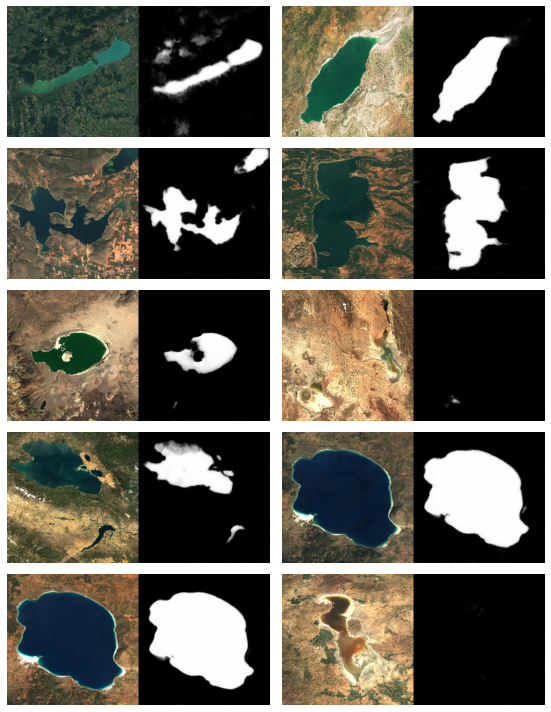

In [70]:
unet_restored = unet_batch()
unet_restored.restore('unet_batch_exp_2.h5')
show_prediction(unet_restored, s2_test_generator)

## Using Residual Connections


In [57]:
class unet_residual(unet_base):
  
  def restore(self, pickle_path):
    self._model.load_weights(pickle_path)

  def batchnorm_activation(self, x):
    x = BatchNormalization()(x)
    return Activation("relu")(x)

  def conv_block(self, x, filters, kernel_size=(3,3), padding='same', strides=1):
    conv = self.batchnorm_activation(x)
    return Conv2D(filters, kernel_size, padding=padding, strides=strides)(conv)

  def bottleneck_block(self, x, filters, kernel_size=(3,3), padding='same', strides=1):
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
    conv = self.conv_block(conv, filters, kernel_size=kernel_size, padding=padding,
                      strides=strides)
    
    bottleneck = Conv2D(filters, kernel_size=(1,1), padding=padding, 
                        strides=strides)(x)
    bottleneck = self.batchnorm_activation(bottleneck)
    return Add()([conv, bottleneck])

  def res_block(self, x, filters, kernel_size=(3,3), padding='same', strides=1):
    res = self.conv_block(x, filters, kernel_size=kernel_size, padding=padding, 
                     strides=strides)
    res = self.conv_block(res, filters, kernel_size=kernel_size, padding=padding,
                     strides=1)
    bottleneck = Conv2D(filters, kernel_size=(1,1), padding=padding, 
                        strides=strides)(x)
    bottleneck = self.batchnorm_activation(bottleneck)
    return Add()([bottleneck, res])
  
  def upsampling_concat_block(self, x, xskip):
    u = UpSampling2D((2, 2))(x)
    return Concatenate()([u, xskip])

  def __init__(self, input_size = (TARGET_HEIGHT, TARGET_WIDTH, 3), filter = 16, 
               ff2 = 128, drop_rate = 0.25):
    
    inputs = Input(input_size)
    layers = []

    # downsample
    e = self.bottleneck_block(inputs, filter)
    layers.append(e) 
    
    for i in range(0, 3):
      filter = filter*2
      e = self.res_block(e, filter, strides=2)
      layers.append(e)

    _ = self.res_block(e, filter, strides=2)

    # bottleneck
    b0 = self.conv_block(_, filter, strides=1)
    u = self.conv_block(b0, filter, strides=1)

    # upsample
    for i in range(3, -1, -1):
      u = self.upsampling_concat_block(u, layers[i])
      u = self.res_block(u, filter)
      filter = filter/2

    # classify 
    outputs = Conv2D(1, (1,1), padding = 'same', activation='sigmoid')(u)

    custom_metrics = [iou_coef, iou_loss, dice_coef, dice_loss]
    self._model = Model(inputs, outputs)
    self._model.compile(optimizer='adam', 
                        loss='binary_crossentropy',
                         metrics = custom_metrics)


In [ ]:
%%time

cb, pickle_path, logs_dir, db_recorder = build_callback_with_adaptive_lru(
    patience_early_stop = 40, patience_lr = 20, factor = 0.2, min_delta = 0.0001, min_lr = 0.0001,
    cooldown = 5,
    experiment_label='unet_residual_exp_2' 
)

unet_residual_ins = unet_residual()

unet_residual_ins.train(train_generator, test_generator, 
                        BATCH_SIZE, 
                        500, 12, 12,in
                        cb)

In [58]:
def restore_residual_model():
  unet_restored = unet_residual()
  unet_restored.restore('unet_residual_exp_1.h5')
  return unet_restored

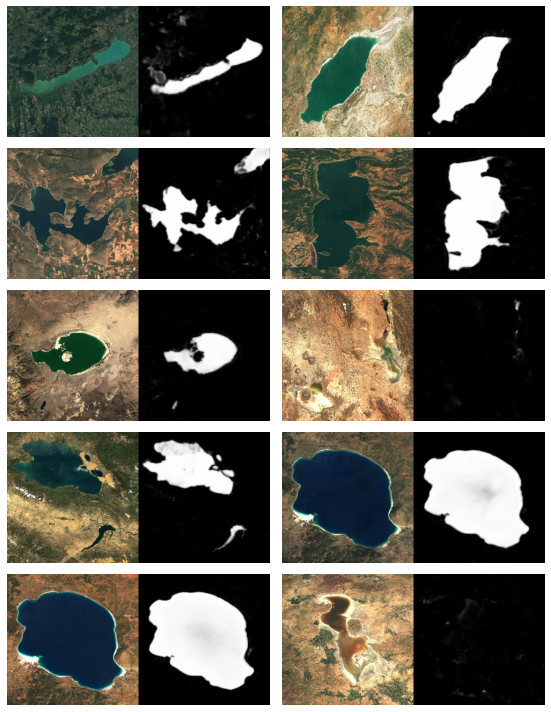

In [74]:
unet_restored = restore_residual_model()
show_prediction(unet_restored, s2_test_generator)

## Using dice loss

In [141]:
%%time

cb, pickle_path, logs_dir, db_recorder = build_callback_with_adaptive_lru(
    patience_early_stop = 30, patience_lr = 10, factor = 0.2, min_delta = 0.0001, min_lr = 0.0001,
    cooldown = 5,
    early_stop_loss_monitor = 'dice_loss',
    experiment_label='unet_residual_exp_1' 
)

unet_residual_dice_ins = unet_residual()

unet_residual_dice_ins.train(train_generator, test_generator, 
                        BATCH_SIZE, 
                        300, 12, 12,
                        cb)

Connected to SQLite DB


'Table created'

Epoch 1/300
12/12 [==============================] - ETA: 0s - loss: 0.3847 - iou_coef: 0.1473 - iou_loss: 0.8527 - dice_coef: 0.9957 - dice_loss: 0.0043
Epoch 00001: dice_loss improved from inf to 0.00427, saving model to unet_residual_exp_1.h5
12/12 [==============================] - 109s 9s/step - loss: 0.3847 - iou_coef: 0.1473 - iou_loss: 0.8527 - dice_coef: 0.9957 - dice_loss: 0.0043 - val_loss: 5.7516 - val_iou_coef: 0.1250 - val_iou_loss: 0.8750 - val_dice_coef: 1.0000 - val_dice_loss: 0.0000e+00 - lr: 0.0010
Epoch 2/300
12/12 [==============================] - ETA: 0s - loss: 0.1809 - iou_coef: 0.1776 - iou_loss: 0.8224 - dice_coef: 0.9956 - dice_loss: 0.0044
Epoch 00002: dice_loss did not improve from 0.00427
12/12 [==============================] - 110s 9s/step - loss: 0.1809 - iou_coef: 0.1776 - iou_loss: 0.8224 - dice_coef: 0.9956 - dice_loss: 0.0044 - val_loss: 0.6279 - val_iou_coef: 0.1124 - val_iou_loss: 0.8876 - val_dice_coef: 1.0000 - val_dice_loss: 0.0000e+00 - lr: 0

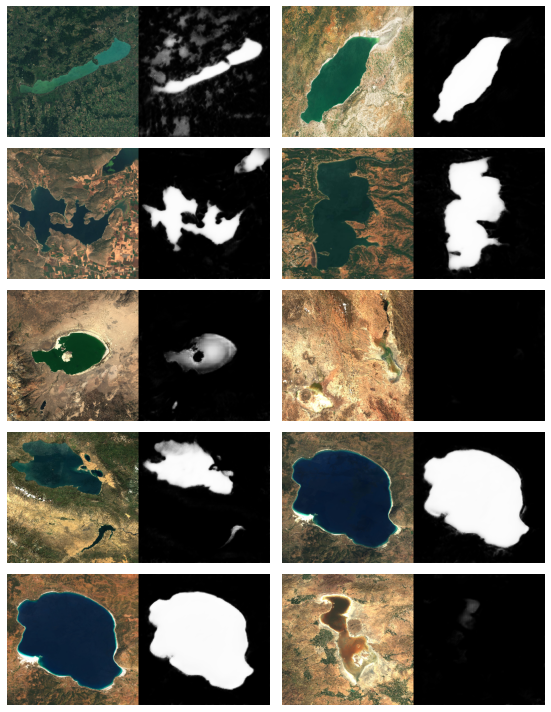

In [148]:
unet_restored = unet_residual()
unet_restored.restore('unet_residual_exp_1.h5')
show_prediction(unet_restored, s2_test_generator)

## Using Ensemble Predictions

In [59]:
def show_combined_plots_with_masks(x, y, pred, batch_sz, fsize):
  cols = 3
  rows = batch_sz
  _, axs = plt.subplots(rows, cols, figsize = fsize)

  def show_images_in_columns(index):
    axs[index][0].imshow(x[index])
    axs[index][0].axis('off')
    axs[index][1].imshow(y[index].squeeze(), cmap='gray')
    axs[index][1].axis('off')
    axs[index][2].imshow(pred[index].squeeze(), cmap='gray')
    axs[index][2].axis('off')

  for i in range (0, batch_sz):
    show_images_in_columns(i)

  plt.tight_layout()

In [70]:
def perform_ensemble_prediction(gen, model_list):
  X_test, y_test = next(gen)
  y_pred_list = []
  ensembled_list = []
  for model in model_list:
    y_pred = model.predict(X_test)
    y_pred_list.append(y_pred)

  num_models = len(model_list)
  num_images = len(y_test) 

  for j in range(0, num_images):
    predicted_mask = y_pred_list[0][j].squeeze()
    for i in range(1, num_models):
      predicted_mask = np.maximum(predicted_mask, y_pred_list[i][j].squeeze())
    ensembled_list.append(predicted_mask)

  show_combined_plots_with_masks(X_test, y_test, 
                                 ensembled_list, BATCH_SIZE, (8, 30))

  return X_test, y_test, ensembled_list

In [71]:
restored_more_layers_model = restore_more_layers_model()
display(restored_more_layers_model)

In [72]:
restored_dropout_model = restore_dropout_model()
display(restored_dropout_model)

In [73]:
restored_residual_model = restore_residual_model()
display(restored_residual_model)

### Predict S2 Cloudless test images

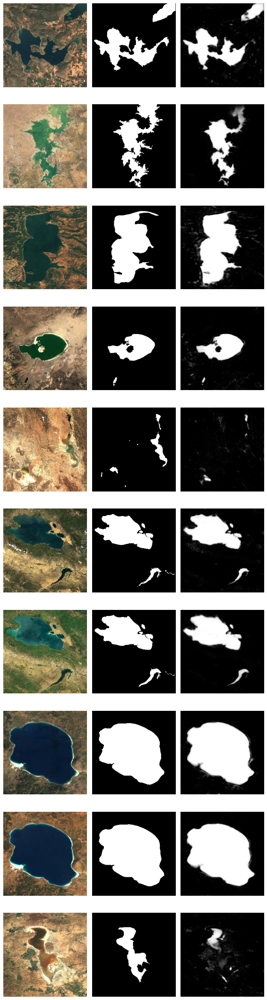

In [128]:
X, y, y_preds = perform_ensemble_prediction(s2_test_generator, 
                                      [restored_dropout_model, 
                                       restored_residual_model, 
                                       restored_more_layers_model])

### Predict with RESISC images

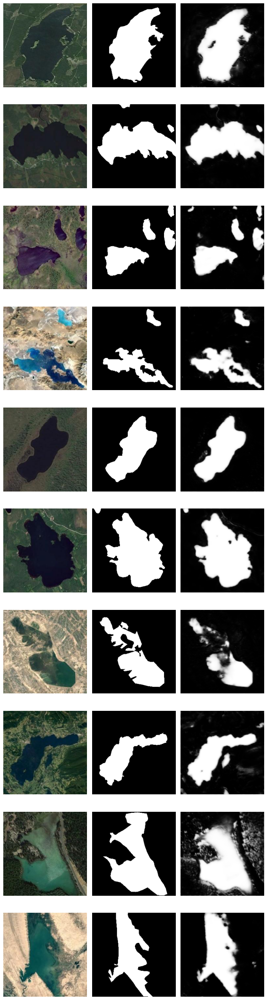

In [129]:
X_resisc, y_resisc, y_preds_resisc = perform_ensemble_prediction(test_generator, 
                                      [restored_dropout_model, 
                                       restored_residual_model, 
                                       restored_more_layers_model])

### Compare IoU

In [130]:
y = y.squeeze()
y_resisc = y_resisc.squeeze()

y_preds = np.array(y_preds)
y_preds_resisc = np.array(y_preds_resisc)

In [138]:
y_preds_resisc[y_preds_resisc >= 0.5] = 1
y_preds_resisc[y_preds_resisc < 0.5] = 0

In [139]:
y_preds[y_preds >= 0.5] = 1
y_preds[y < 0.5] = 0

In [142]:
display(f'Shape of predicted labels = {y_preds[0].shape}')
display(f'Shape of actual masks = {y.shape}')

'Shape of predicted labels = (256, 256)'

'Shape of actual masks = (10, 256, 256)'

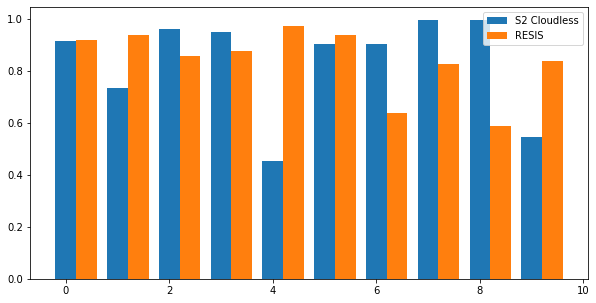

In [165]:
iou_list_cloudless = []
iou_list_resis = []

num_images = BATCH_SIZE
avg_method = 'micro'

for i in range(0, num_images):
  iou_list_cloudless.append(iou_coef(y[i], y_preds[i]).numpy())

for i in range(0, num_images):
  iou_list_resis.append(iou_coef(y_resisc[i], y_preds_resisc[i]).numpy())

_, axs = plt.subplots(1,1, figsize=(10, 5))
width = 0.4

indices = np.arange(0, num_images)

l1 = axs.bar(indices, iou_list_cloudless, width, label='S2 Cloudless')
l2 = axs.bar(indices + width, iou_list_resis, width, label='RESIS')
axs.legend(handles=[l1, l2])

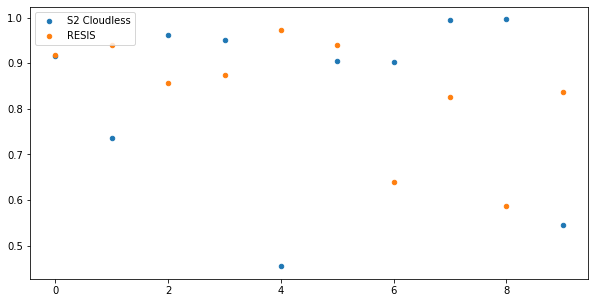

In [171]:
iou_list_cloudless = []
iou_list_resis = []

num_images = BATCH_SIZE
avg_method = 'micro'

for i in range(0, num_images):
  iou_list_cloudless.append(iou_coef(y[i], y_preds[i]).numpy())

for i in range(0, num_images):
  iou_list_resis.append(iou_coef(y_resisc[i], y_preds_resisc[i]).numpy())

_, axs = plt.subplots(1,1, figsize=(10, 5))
width = 20

indices = np.arange(0, num_images)

l1 = axs.scatter(indices, iou_list_cloudless, width, label='S2 Cloudless')
l2 = axs.scatter(indices, iou_list_resis, width, label='RESIS')
axs.legend(handles=[l1, l2])